**Bitcoin OTC trust weighted signed network**

Link: https://snap.stanford.edu/data/soc-sign-bitcoin-otc.html

Doc: https://docs.google.com/document/d/1tAFRoFqXCUJYJKvXivY4Cil4Ks9b00djZ1odEHB_V-k/edit?usp=sharing

# (0) Configurações

In [1]:
import gzip
import shutil
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import plotly.graph_objs as go
from collections import Counter
import numpy as np
import random
from datetime import datetime

# (1) Gerando grafo e métricas básicas

## (1.1) Carregando dataset

In [2]:
!wget https://snap.stanford.edu/data/soc-sign-bitcoinotc.csv.gz

with gzip.open('soc-sign-bitcoinotc.csv.gz', 'rb') as f_in:
  with open('soc-sign-bitcoinotc.csv', 'wb') as f_out:
    shutil.copyfileobj(f_in, f_out)

--2025-10-20 23:29:19--  https://snap.stanford.edu/data/soc-sign-bitcoinotc.csv.gz
Resolving snap.stanford.edu (snap.stanford.edu)... 171.64.75.80
Connecting to snap.stanford.edu (snap.stanford.edu)|171.64.75.80|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 397258 (388K) [application/x-gzip]
Saving to: ‘soc-sign-bitcoinotc.csv.gz’

soc-sign-bitcoinotc 100%[===================>] 387.95K   533KB/s    in 0.7s    

2025-10-20 23:29:20 (533 KB/s) - ‘soc-sign-bitcoinotc.csv.gz’ saved [397258/397258]



In [3]:
df = pd.read_csv('soc-sign-bitcoinotc.csv', header=None)

# defininido nome das colunas
df.columns = ['source', 'target', 'rating', 'time']

df.head()

,source,target,rating,time
0,6,2,4,1.289242e+09
1,6,5,2,1.289242e+09
2,1,15,1,1.289243e+09
3,4,3,7,1.289245e+09
4,13,16,8,1.289254e+09


In [4]:
print(df.shape)

(35592, 4)


## (1.2) Gerando Grafo

In [5]:
# O dataset é uma linha de arestas:
# Cada linha mostra qual usuário avaliou qual, com qual nota e tempo

# Cria um grafo direcionado
G = nx.DiGraph()

# Adicionar arestas com peso
for _, row in df.iterrows():
  G.add_edge(row['source'], row['target'], weight=row['rating'], time=row['time'])

print(G)

DiGraph with 5881 nodes and 35592 edges


In [6]:
print(f"Número de nós: {G.number_of_nodes()}")
print(f"Número de arestas: {G.number_of_edges()}")

# Verificar atributos de uma aresta específica
print(G[1][2])

Número de nós: 5881
Número de arestas: 35592
{'weight': np.float64(8.0), 'time': np.float64(1296629343.62073)}


In [7]:
print(G.nodes.data())
print(G.edges.data())

[(np.float64(6.0), {}), (np.float64(2.0), {}), (np.float64(5.0), {}), (np.float64(1.0), {}), (np.float64(15.0), {}), (np.float64(4.0), {}), (np.float64(3.0), {}), (np.float64(13.0), {}), (np.float64(16.0), {}), (np.float64(10.0), {}), (np.float64(7.0), {}), (np.float64(21.0), {}), (np.float64(20.0), {}), (np.float64(8.0), {}), (np.float64(17.0), {}), (np.float64(23.0), {}), (np.float64(25.0), {}), (np.float64(26.0), {}), (np.float64(28.0), {}), (np.float64(29.0), {}), (np.float64(31.0), {}), (np.float64(32.0), {}), (np.float64(34.0), {}), (np.float64(35.0), {}), (np.float64(36.0), {}), (np.float64(37.0), {}), (np.float64(44.0), {}), (np.float64(39.0), {}), (np.float64(45.0), {}), (np.float64(19.0), {}), (np.float64(46.0), {}), (np.float64(47.0), {}), (np.float64(51.0), {}), (np.float64(52.0), {}), (np.float64(53.0), {}), (np.float64(54.0), {}), (np.float64(41.0), {}), (np.float64(55.0), {}), (np.float64(57.0), {}), (np.float64(61.0), {}), (np.float64(65.0), {}), (np.float64(56.0), {}),

In [8]:
print(G.has_node(1))
print(G.has_node(2))
print(G.has_edge(1, 2))
print(G.has_edge(1, 434))

True
True
True
False


## (1.3) Visualização

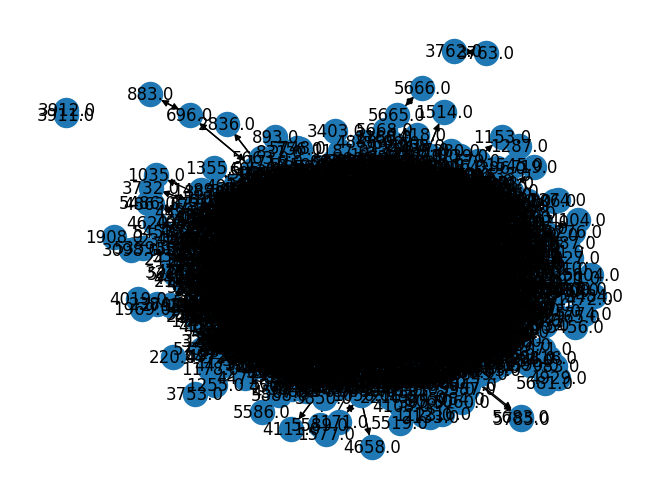

In [10]:
# Visualização do grafo
nx.draw(G, with_labels=True)
plt.show()

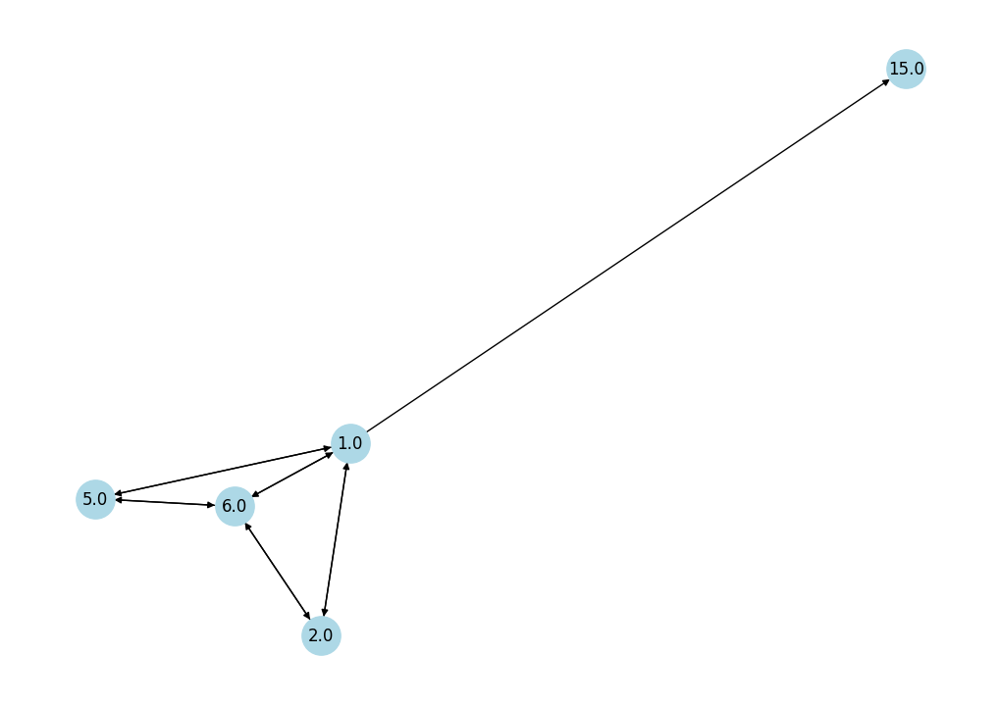

In [11]:
# Visualização de um subgrafo
nodes_sub = list(G.nodes)[:5]
subG = G.subgraph(nodes_sub)

plt.figure(figsize=(10, 7))
pos = nx.spring_layout(subG, seed=42)
nx.draw(subG, pos, with_labels=True, node_size=800, node_color="lightblue", arrows=True)
nx.circular_layout(subG)
plt.show()

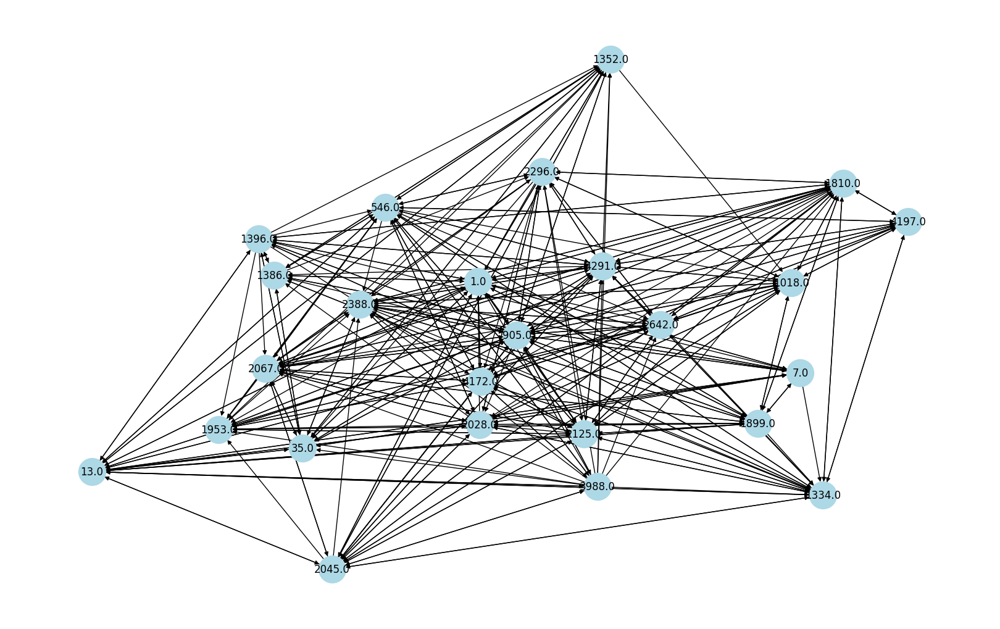

In [12]:
# Visualizando grafo com nós de maior grau
degree_dict = dict(G.degree())
top_nodes = sorted(degree_dict, key=degree_dict.get, reverse=True)[:25]
subG = G.subgraph(top_nodes)

plt.figure(figsize=(16, 10))
pos = nx.spring_layout(subG, seed=42, k=2)  # valores de k maiores -> nós mais afastados
nx.draw(subG, pos, with_labels=True, node_size=1000, node_color="lightblue", arrows=True)
nx.circular_layout(subG)
plt.show()

## (1.4) Visualização Interativa

In [13]:
# Selecionar nós com maior grau
degree_dict = dict(G.degree())
top_nodes = sorted(degree_dict, key=degree_dict.get, reverse=True)[:25]
subG = G.subgraph(top_nodes)


# Layout
pos = nx.spring_layout(subG, seed=42, k=2)

# Criar as arestas para Plotly
edge_x = []
edge_y = []

for edge in subG.edges():
  x0, y0 = pos[edge[0]]
  x1, y1 = pos[edge[1]]
  edge_x.extend([x0, x1, None])
  edge_y.extend([y0, y1, None])

edge_trace = go.Scatter(
  x=edge_x, y=edge_y,
  line=dict(width=1, color='#888'),
  hoverinfo='none',
  mode='lines')

# Criar os nós para Plotly
node_x = []
node_y = []

for node in subG.nodes():
  x, y = pos[node]
  node_x.append(x)
  node_y.append(y)

node_trace = go.Scatter(
  x=node_x, y=node_y,
  mode='markers+text',
  hoverinfo='text',
  text=[str(n) for n in subG.nodes()],
  textposition="top center",
  marker=dict(
    showscale=True,
    colorscale='Blues',
    reversescale=True,
    color=[subG.degree(n) for n in subG.nodes()],
    size=15,
    colorbar=dict(
      thickness=15,
      title='Número de Conexões (Grau)',
      xanchor='left',
      titleside='right'
    ),
    line_width=2))

# Adicionar nomes dos nós ao hover
node_trace.text = [f'Nó: {node} | Grau: {subG.degree(node)}' for node in subG.nodes()]

# Criar figura
fig = go.Figure(data=[edge_trace, node_trace],
  layout=go.Layout(
    title='Rede Bitcoin OTC - Nós de Maior Grau',
    titlefont_size=20,
    showlegend=False,
    hovermode='closest',
    margin=dict(b=20,l=5,r=5,t=40),
    annotations=[dict(
      text="Interativo com Plotly",
      showarrow=False,
      xref="paper", yref="paper",
      x=0.005, y=-0.002 )],
    xaxis=dict(showgrid=False, zeroline=False),
    yaxis=dict(showgrid=False, zeroline=False))
    )

fig.show()

## (1.5) Conceitos Básicos

In [14]:
# Calculando grau médio do grafo
degrees = G.degree()

# Acumulador
total = 0

# Soma os graus
for node in G.nodes():
  total += degrees[node]

# Número de nós
n_nodes = G.number_of_nodes()

# Cálculo
degree_avg = total / n_nodes

print("Grau médio:", degree_avg)

Grau médio: 12.104063934704982


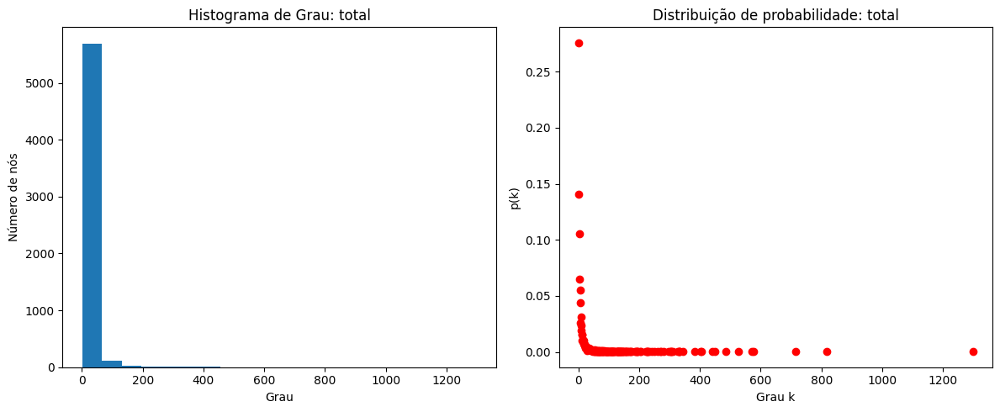

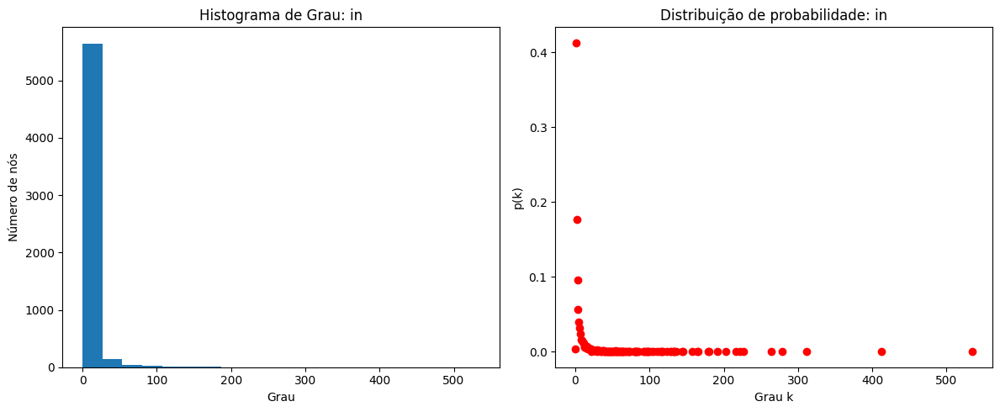

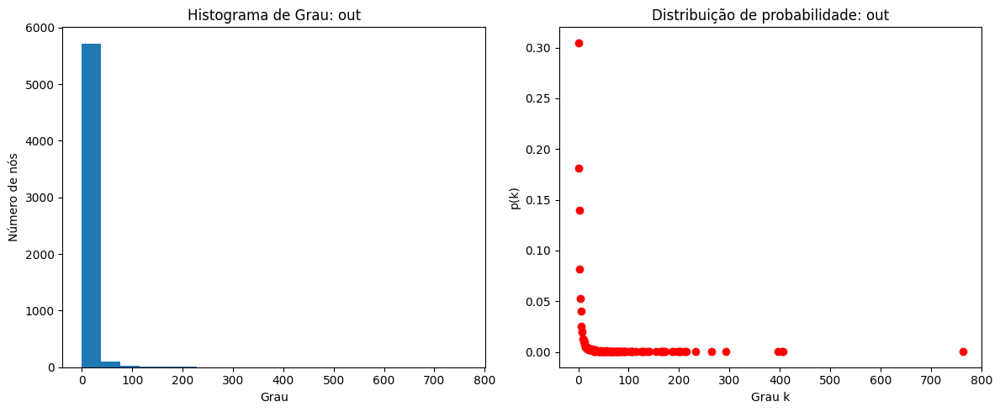

In [15]:
# Distribuições de grau //
def plot_degree_distribution(G, degree_type="total"):
  if degree_type == "in":
    degree_sequence = [d for n, d in G.in_degree()]
  elif degree_type == "out":
    degree_sequence = [d for n, d in G.out_degree()]
  else:
    degree_sequence = [d for n, d in G.degree()]

  degree_count = Counter(degree_sequence)
  deg, cnt = zip(*sorted(degree_count.items()))

  N = G.number_of_nodes()
  prob = [c / N for c in cnt]  # p(k) = N_k / N

  fig, ax = plt.subplots(1, 2, figsize=(12, 5))

  # Histograma
  ax[0].hist(degree_sequence, bins=20)
  ax[0].set_title(f'Histograma de Grau: {degree_type}')
  ax[0].set_xlabel('Grau')
  ax[0].set_ylabel('Número de nós')

  # Distribuição de probabilidade (gráfico de pontos)
  ax[1].scatter(deg, prob, color='red')
  ax[1].set_title(f'Distribuição de probabilidade: {degree_type}')
  ax[1].set_xlabel('Grau k')
  ax[1].set_ylabel('p(k)')

  plt.tight_layout()
  plt.show()

plot_degree_distribution(G, "total")
plot_degree_distribution(G, "in")
plot_degree_distribution(G, "out")

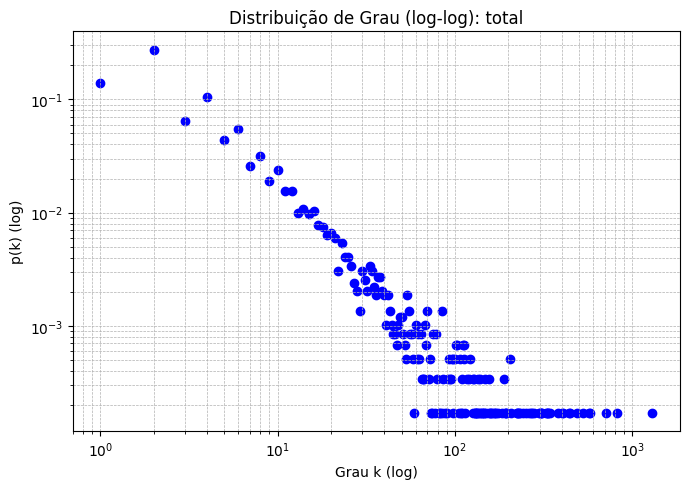

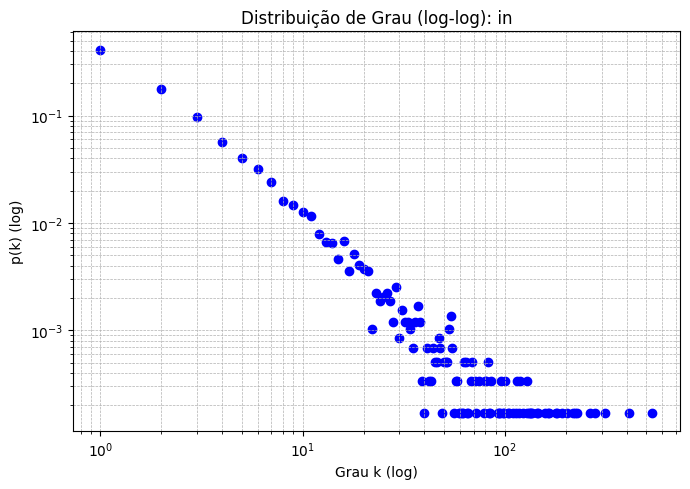

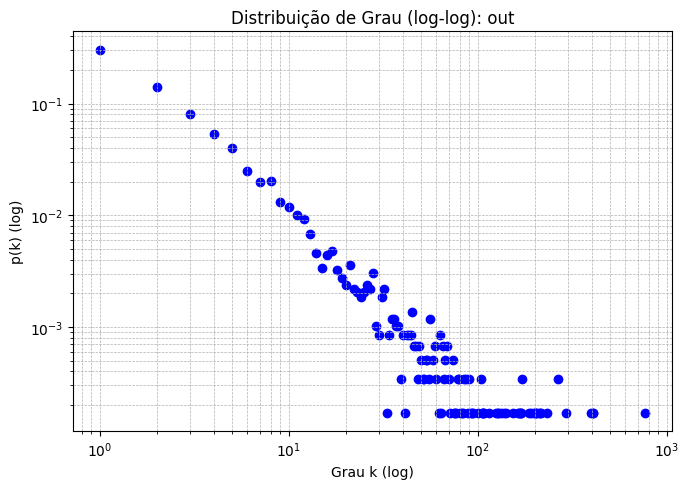

In [16]:
def plot_degree_distribution_loglog(G, degree_type="total"):
  if degree_type == "in":
    degree_sequence = [d for n, d in G.in_degree()]
  elif degree_type == "out":
    degree_sequence = [d for n, d in G.out_degree()]
  else:
    degree_sequence = [d for n, d in G.degree()]

  degree_count = Counter(degree_sequence)
  deg, cnt = zip(*sorted(degree_count.items()))

  N = G.number_of_nodes()
  prob = [c / N for c in cnt]  # p(k) = N_k / N

  fig, ax = plt.subplots(figsize=(7, 5))

  # Usando apenas graus > 0 para evitar log(0)
  deg_log = np.array(deg)
  prob_log = np.array(prob)
  mask = deg_log > 0

  ax.scatter(deg_log[mask], prob_log[mask], color='blue')
  ax.set_xscale('log')
  ax.set_yscale('log')

  ax.set_title(f'Distribuição de Grau (log-log): {degree_type}')
  ax.set_xlabel('Grau k (log)')
  ax.set_ylabel('p(k) (log)')

  plt.tight_layout()
  plt.grid(True, which="both", ls="--", linewidth=0.5)
  plt.show()

plot_degree_distribution_loglog(G, "total")
plot_degree_distribution_loglog(G, "in")
plot_degree_distribution_loglog(G, "out")

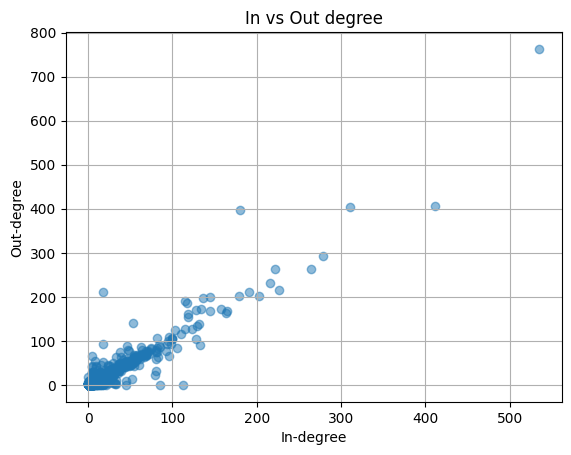

In [17]:
# Comparando in-degree e out-degree diretamente:
plt.scatter([d for n, d in G.in_degree()], [d for n, d in G.out_degree()], alpha=0.5)
plt.xlabel("In-degree")
plt.ylabel("Out-degree")
plt.title("In vs Out degree")
plt.grid(True)
plt.show()

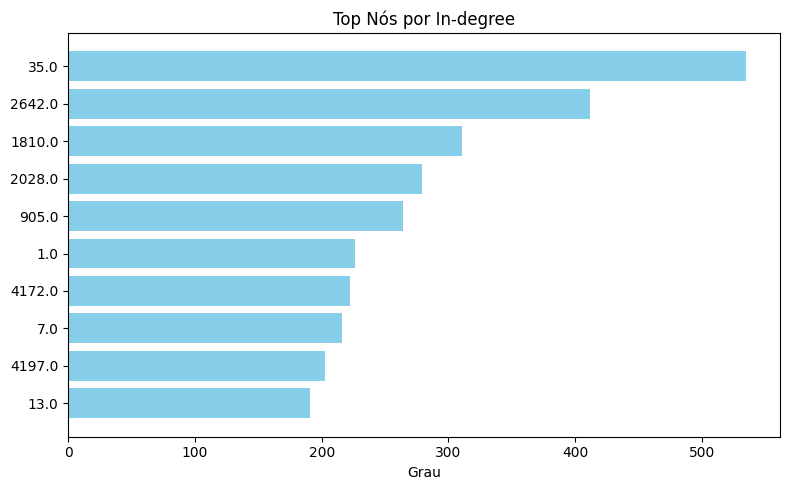

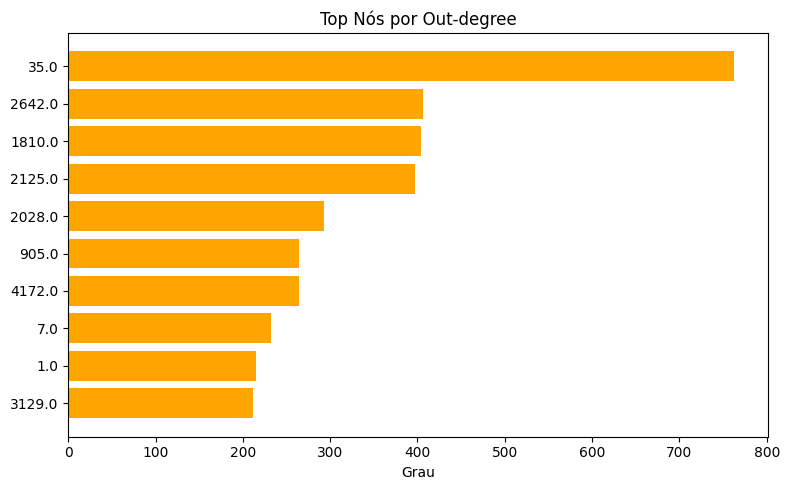

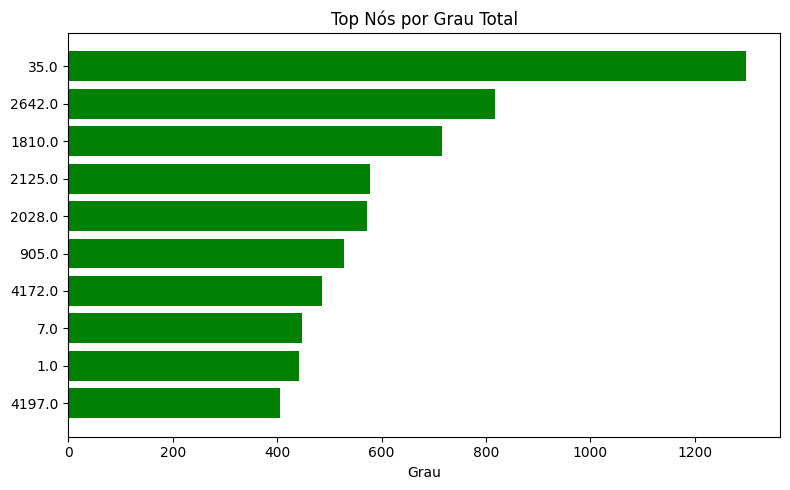

In [18]:
# Plotar ranking de nós por grau
def plot_top_nodes_by_degree(G, top_n=10):
  in_deg = dict(G.in_degree())
  out_deg = dict(G.out_degree())
  total_deg = dict(G.degree())

  # Ordenar nós por grau decrescente
  top_in = sorted(in_deg.items(), key=lambda x: x[1], reverse=True)[:top_n]
  top_out = sorted(out_deg.items(), key=lambda x: x[1], reverse=True)[:top_n]
  top_total = sorted(total_deg.items(), key=lambda x: x[1], reverse=True)[:top_n]

  def plot_bar(data, title, color):
    nodes, values = zip(*data)
    plt.figure(figsize=(8, 5))
    plt.barh(range(len(nodes)), values, color=color)
    plt.yticks(range(len(nodes)), nodes)
    plt.xlabel("Grau")
    plt.title(title)
    plt.gca().invert_yaxis()
    plt.tight_layout()
    plt.show()

  # Plots
  plot_bar(top_in, "Top Nós por In-degree", "skyblue")
  plot_bar(top_out, "Top Nós por Out-degree", "orange")
  plot_bar(top_total, "Top Nós por Grau Total", "green")

plot_top_nodes_by_degree(G, top_n=10)

## (1.6) Centralidade

In [19]:
def plot_heatmap_centrality(G, centrality_func, metric_name, top_n=100, show_labels=False, k_layout=0.8, **kwargs):
  # Calcula centralidade
  centrality = centrality_func(G, **kwargs)

  # identifica no com maior centralidade
  max_node, max_value = max(centrality.items(), key=lambda x: x[1])
  print(f"[{metric_name}] Nó com maior centralidade: {max_node} (valor = {max_value:.6f})")

  # Ordenar e pegar os top N
  top_nodes = sorted(centrality.items(), key=lambda x: x[1], reverse=True)[:top_n]
  top_nodes_ids = [n for n, _ in top_nodes]

  # Cria subgrafo
  H = G.subgraph(top_nodes_ids)


  # Obter valores de centralidade para colorir o mapa
  values = [centrality[n] for n in H.nodes()]

  # plotar
  pos = nx.spring_layout(H, seed=42, k=k_layout)
  plt.figure(figsize=(14, 10))
  nodes = nx.draw_networkx_nodes(H, pos, node_color=values, cmap=plt.cm.viridis, node_size=400)
  nx.draw_networkx_edges(H, pos, alpha=0.3)

  # Mostrar rótulos
  if show_labels:
      nx.draw_networkx_labels(H, pos, font_size=6)

  plt.colorbar(nodes)
  plt.title(f"Mapa de calor - {metric_name}")
  plt.axis('off')
  plt.show()

[Degree Centrality] Nó com maior centralidade: 35.0 (valor = 0.220748)


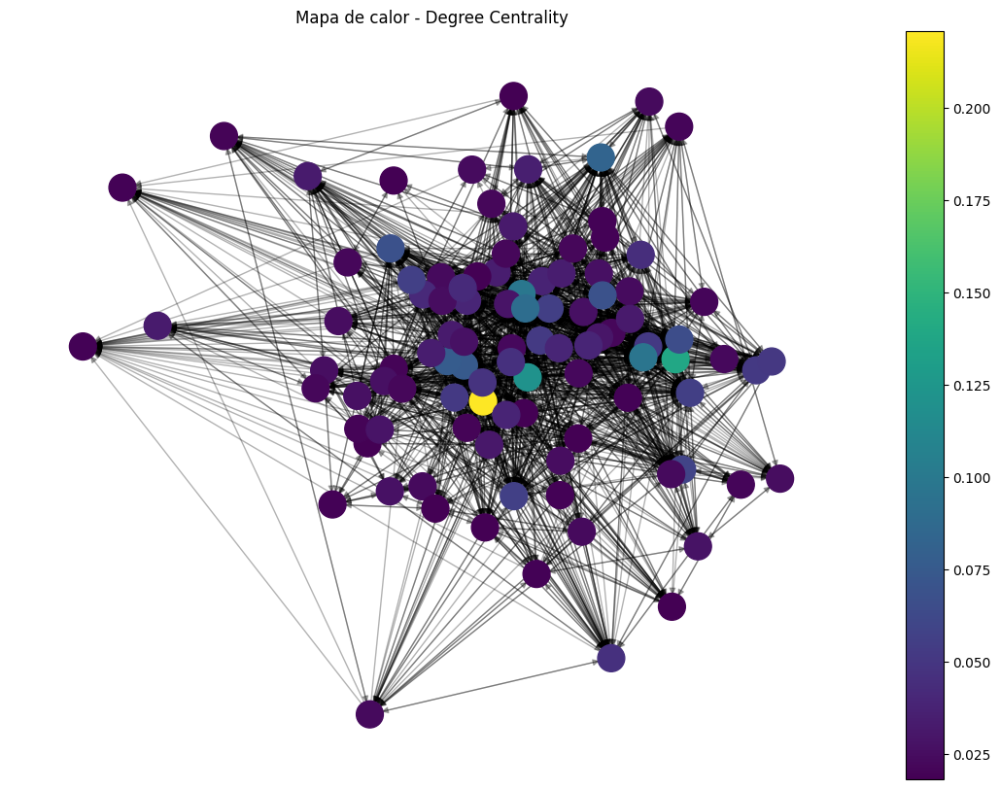

[In-Degree Centrality] Nó com maior centralidade: 35.0 (valor = 0.090986)


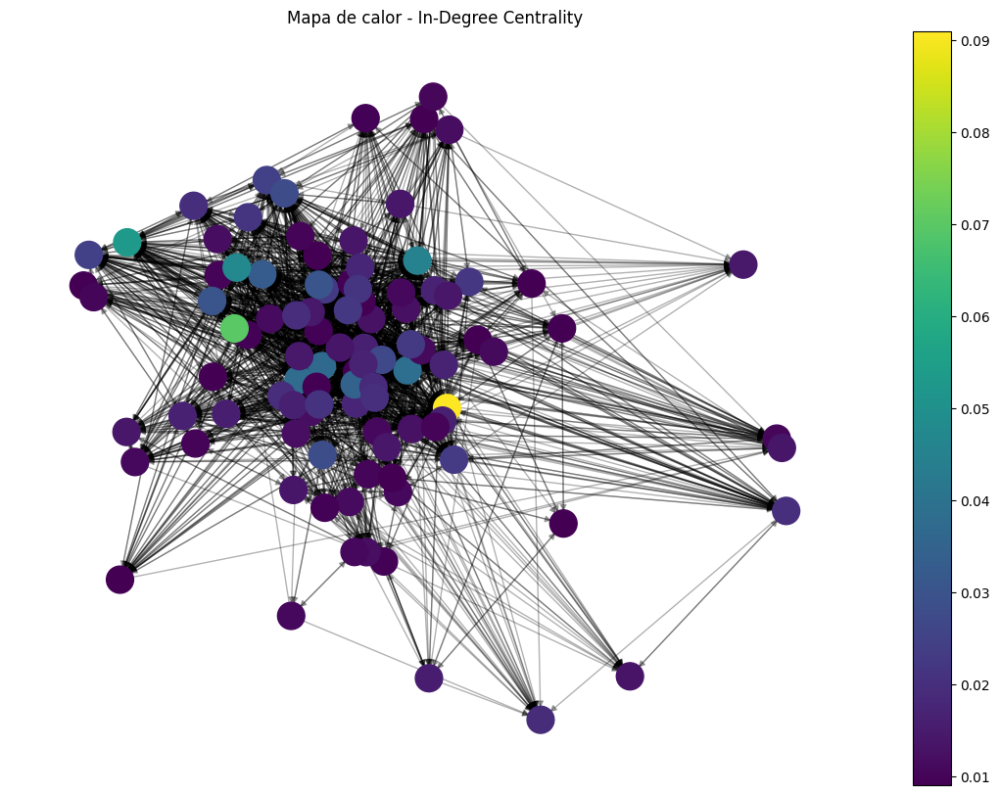

[Out-Degree Centrality] Nó com maior centralidade: 35.0 (valor = 0.129762)


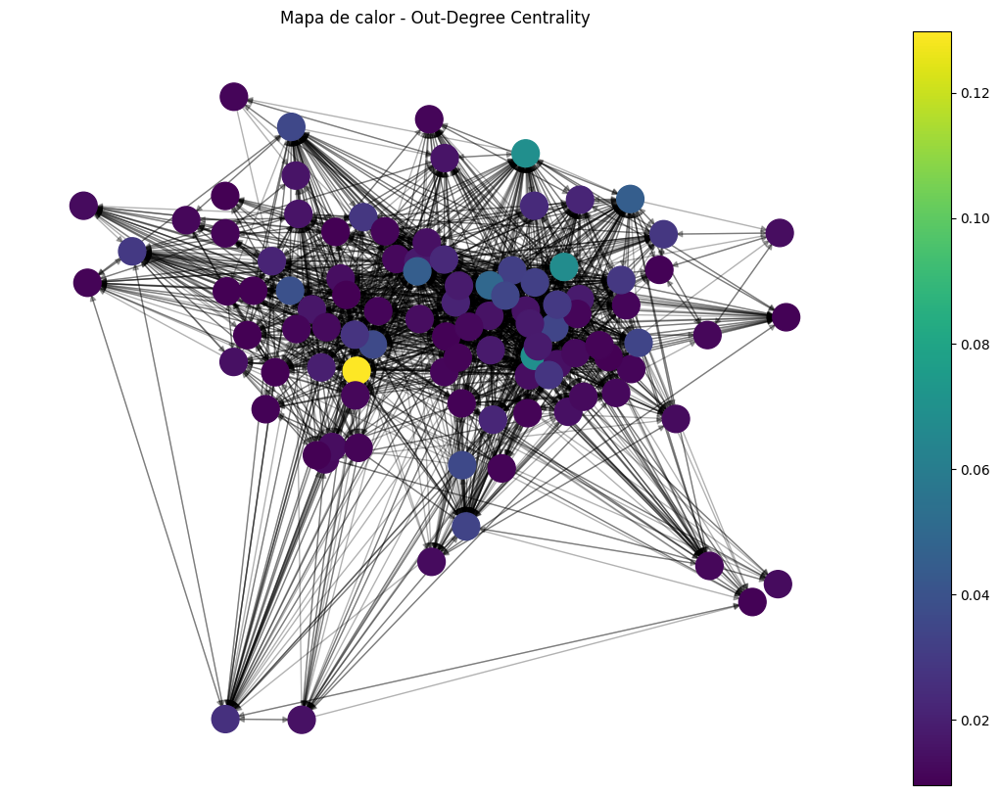

[Eigenvector Centrality] Nó com maior centralidade: 2642.0 (valor = 0.202195)


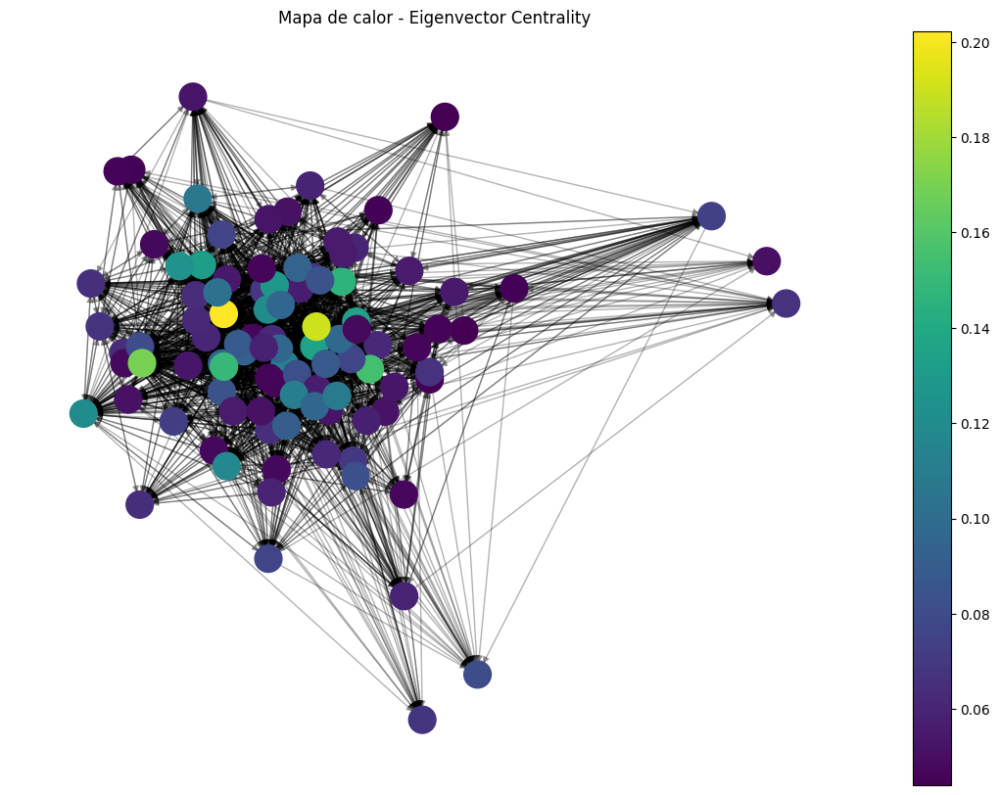

[Closeness Centrality] Nó com maior centralidade: 905.0 (valor = 0.339398)


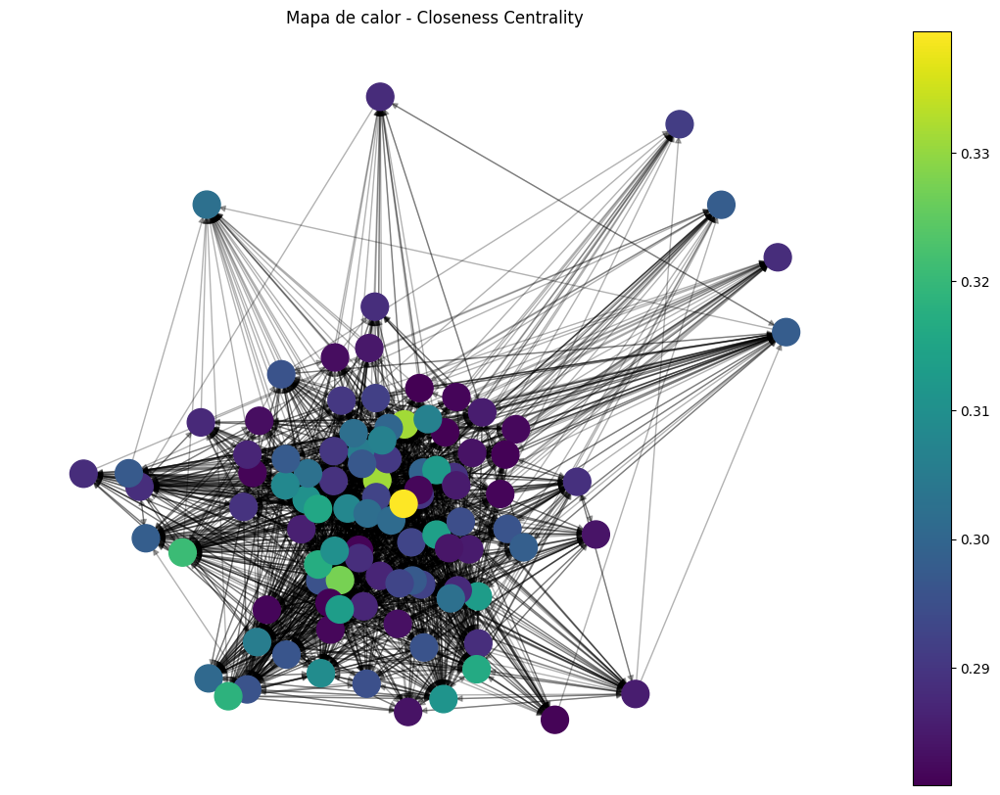

[Betweenness Centrality] Nó com maior centralidade: 35.0 (valor = 0.142110)


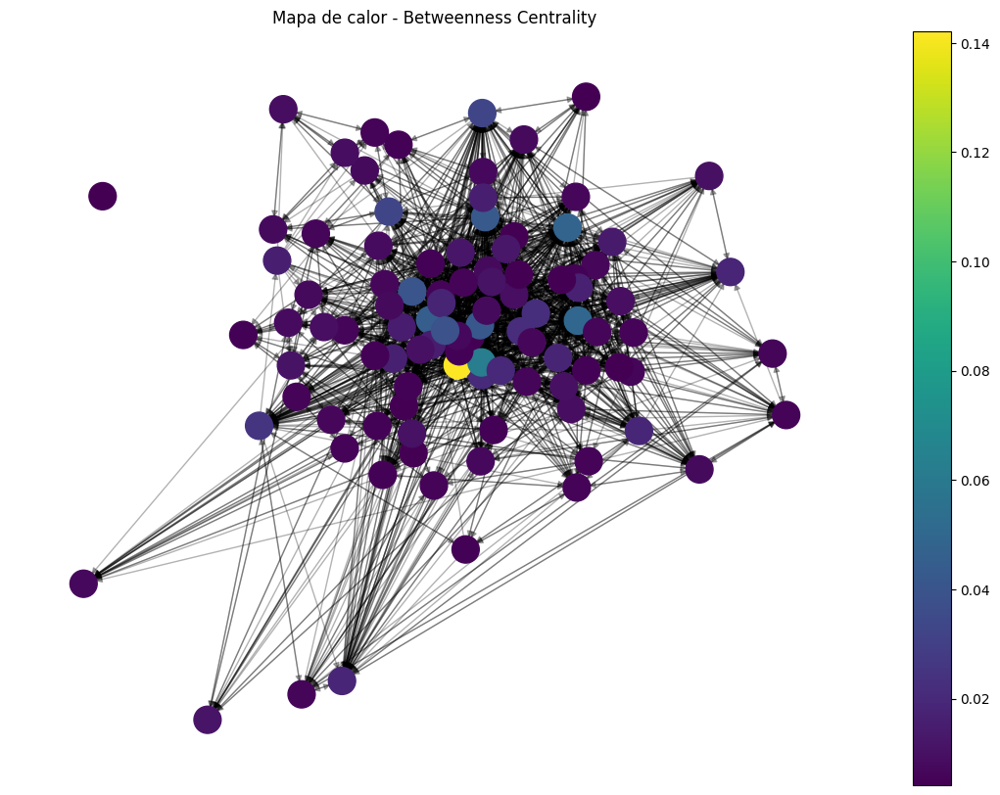

In [20]:
plot_heatmap_centrality(G, nx.degree_centrality, "Degree Centrality")
plot_heatmap_centrality(G, nx.in_degree_centrality, "In-Degree Centrality")
plot_heatmap_centrality(G, nx.out_degree_centrality, "Out-Degree Centrality")
plot_heatmap_centrality(G, nx.eigenvector_centrality, "Eigenvector Centrality", max_iter=1000)
plot_heatmap_centrality(G, nx.closeness_centrality, "Closeness Centrality")
plot_heatmap_centrality(G, nx.betweenness_centrality, "Betweenness Centrality")

## (1.7) Densidade

In [21]:
# Métricas básicas
num_nodes = G.number_of_nodes()
num_edges = G.number_of_edges()
densidade = nx.density(G)
grau_medio = sum(dict(G.degree()).values()) / num_nodes
grau_medio_entrada = sum(dict(G.in_degree()).values()) / num_nodes
grau_medio_saida = sum(dict(G.out_degree()).values()) / num_nodes


print(f"Número de nós: {num_nodes}")
print(f"Número de arestas: {num_edges}")
print(f"Densidade: {densidade:.6f}")
print(f"Grau médio: {grau_medio:.2f}")
print(f"Grau médio de entrada: {grau_medio_entrada:.2f}")
print(f"Grau médio de saída: {grau_medio_saida:.2f}")

# Componentes fortemente conectados
num_scc = nx.number_strongly_connected_components(G)
print(f"Número de componentes fortemente conectados: {num_scc}")

Número de nós: 5881
Número de arestas: 35592
Densidade: 0.001029
Grau médio: 12.10
Grau médio de entrada: 6.05
Grau médio de saída: 6.05
Número de componentes fortemente conectados: 1144


# (2) Comunidades

## (2.1) Girvan-Newman Algorithm (Edge Betweenness)

Baseia-se na eliminação iterativa das arestas que apresentam o maior número de caminhos mais curtos entre os nós que as atravessam. Ao remover as arestas do grafo, uma a uma, a rede se divide em partes menores.

**Betweenness centrality**: número de caminhos mais curtos no grafo que passa pelo nó ou aresta dividido pelo número total de caminhos mais curtos.

O algoritmo de Girvan-Newman pode ser dividido em quatro etapas principais:

1. Para cada aresta em um grafo, calcule a centralidade de intermediação da aresta.
2. Remova a aresta com a maior centralidade de intermediação.
3. Calcule a centralidade de intermediação para cada aresta restante.
4. Repita as etapas 2 a 4 até que não haja mais arestas restantes.

### Amostra

In [ ]:
# Amostragem aleatória de nós
import random

# número de nós mantidos
sample_size = 500
nodes_sample = random.sample(list(G.nodes()), sample_size)

# subgrafo induzido
subG_nodes = G.subgraph(nodes_sample).copy()

In [ ]:
# Girvan-Newman Algorithm - Testando com subgrafo induzido
communities_generator = nx.community.girvan_newman(subG_nodes)
top_level_communities = next(communities_generator)
next_level_communities = next(communities_generator)

# Print possible communities
for com in communities_generator:
  print(com)

({np.float64(5955.0), np.float64(3.0), np.float64(1636.0), np.float64(3887.0), np.float64(5650.0), np.float64(3445.0), np.float64(439.0), np.float64(184.0), np.float64(217.0), np.float64(4311.0), np.float64(1885.0)}, {np.float64(2051.0)}, {np.float64(3714.0), np.float64(4611.0), np.float64(4101.0), np.float64(4743.0), np.float64(1289.0), np.float64(1034.0), np.float64(4875.0), np.float64(5397.0), np.float64(4119.0), np.float64(2201.0), np.float64(4762.0), np.float64(3610.0), np.float64(1832.0), np.float64(2219.0), np.float64(4395.0), np.float64(3760.0), np.float64(1584.0), np.float64(5298.0), np.float64(1334.0), np.float64(5691.0), np.float64(700.0), np.float64(4414.0), np.float64(2243.0), np.float64(5443.0), np.float64(3788.0), np.float64(1487.0), np.float64(5712.0), np.float64(3791.0), np.float64(3451.0), np.float64(3668.0), np.float64(3795.0), np.float64(1628.0), np.float64(4703.0), np.float64(5985.0), np.float64(5476.0), np.float64(1508.0), np.float64(1765.0), np.float64(4584.0), n

In [ ]:
# Número de Comunidades
num_communities = len(next_level_communities)
print(f"Número de comunidades identificadas: {num_communities}")

Número de comunidades identificadas: 378


In [ ]:
# Tamanho das Comunidades
community_sizes = [len(community) for community in next_level_communities]
print(f"Tamanhos das comunidades: {community_sizes}")
print(f"Maior comunidade: {max(community_sizes)} nós")
print(f"Menor comunidade: {min(community_sizes)} nós")
print(f"Tamanho médio: {sum(community_sizes)/len(community_sizes):.2f} nós")

Tamanhos das comunidades: [57, 1, 1, 1, 19, 2, 1, 36, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 3, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1

In [ ]:
# Modularidade
# Calcular modularidade
modularity = nx.community.modularity(subG_nodes, next_level_communities)
print(f"Modularidade: {modularity:.4f}")

Modularidade: 0.7747


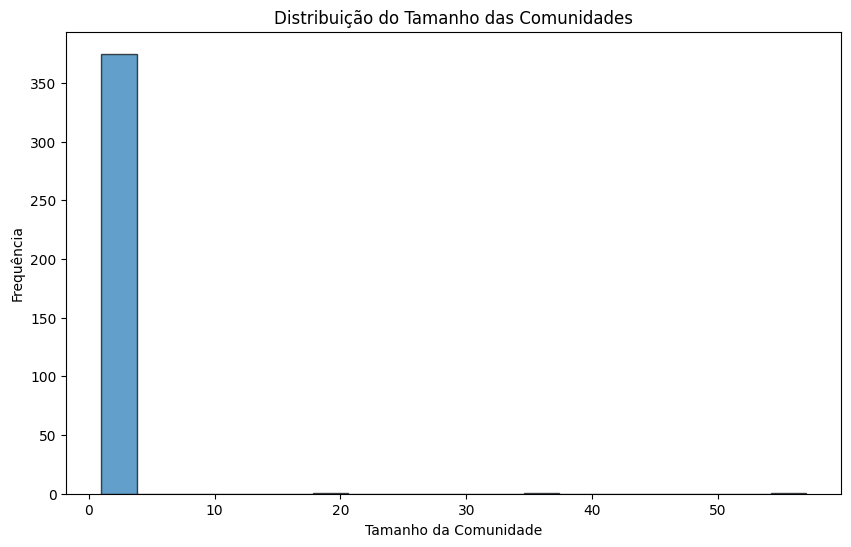

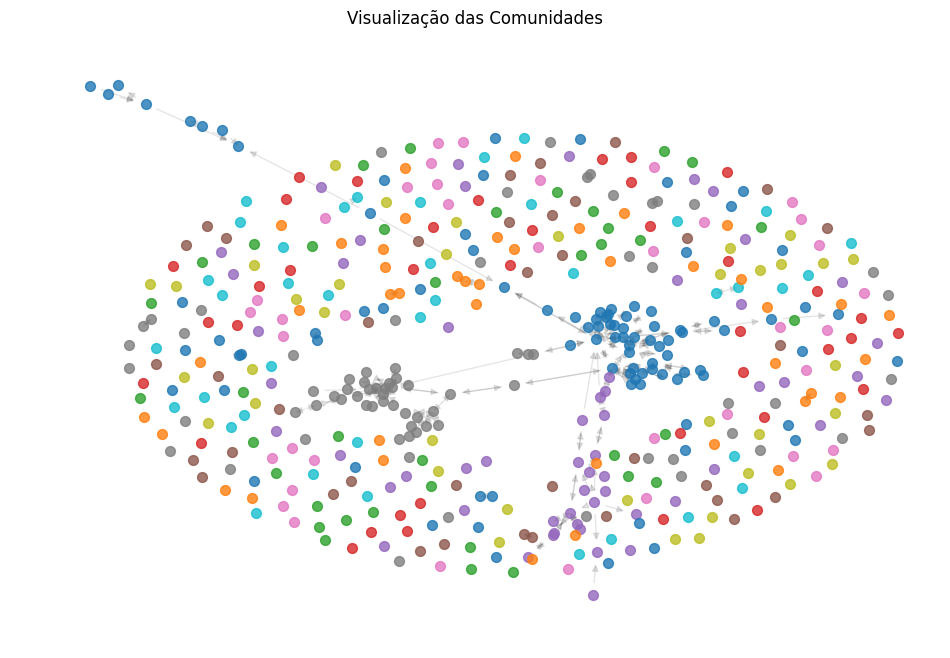

In [ ]:
# Visualização das Comunidades
# Plotar distribuição de tamanhos
plt.figure(figsize=(10, 6))
plt.hist(community_sizes, bins=20, alpha=0.7, edgecolor='black')
plt.xlabel('Tamanho da Comunidade')
plt.ylabel('Frequência')
plt.title('Distribuição do Tamanho das Comunidades')
plt.show()

# Plotar comunidades no grafo
pos = nx.spring_layout(subG_nodes)
colors = plt.cm.tab10.colors

plt.figure(figsize=(12, 8))
for i, community in enumerate(next_level_communities):
    nx.draw_networkx_nodes(subG_nodes, pos, nodelist=list(community),
                          node_color=[colors[i % len(colors)]],
                          node_size=50, alpha=0.8)
nx.draw_networkx_edges(subG_nodes, pos, alpha=0.1)
plt.title('Visualização das Comunidades')
plt.axis('off')
plt.show()

### Completo

In [ ]:
# Girvan-Newman Algorithm
communities_generator = nx.community.girvan_newman(G)
top_level_communities = next(communities_generator)
next_level_communities = next(communities_generator)

In [ ]:
# Número de Comunidades
num_communities = len(next_level_communities)
print(f"Número de comunidades identificadas: {num_communities}")

Número de comunidades identificadas: 378


In [ ]:
# Tamanho das Comunidades
community_sizes = [len(community) for community in next_level_communities]
print(f"Tamanhos das comunidades: {community_sizes}")
print(f"Maior comunidade: {max(community_sizes)} nós")
print(f"Menor comunidade: {min(community_sizes)} nós")
print(f"Tamanho médio: {sum(community_sizes)/len(community_sizes):.2f} nós")

Tamanhos das comunidades: [57, 1, 1, 1, 19, 2, 1, 36, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 3, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1

In [ ]:
# Modularidade
# Calcular modularidade
modularity = nx.community.modularity(subG_nodes, next_level_communities)
print(f"Modularidade: {modularity:.4f}")

Modularidade: 0.7747


## (2.2) Louvain

In [ ]:
communities = nx.community.louvain_communities(G, resolution=1.0, seed=42)
print(f"Número de comunidades encontradas: {len(communities)}")

# Análise das comunidades
community_sizes = [len(community) for community in communities]
print(f"Tamanhos das comunidades: {community_sizes}")

Número de comunidades encontradas: 392
Tamanhos das comunidades: [53, 16, 2, 4, 53, 9, 1, 36, 3, 5, 1, 1, 1, 13, 250, 1, 1, 238, 3, 1, 1, 175, 1, 1345, 2, 10, 1, 1, 1, 1, 1, 1, 1, 1, 1, 248, 1, 1, 4, 127, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 443, 1, 1, 1, 1, 1, 1, 1, 3, 1, 1, 32, 1, 1, 1, 3, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 4, 16, 1, 1, 5, 1, 69, 536, 2, 23, 1, 4, 1, 1, 2, 1, 1, 1, 1, 1, 1, 489, 2, 1, 1, 1234, 1, 1, 1, 1, 1, 1, 2, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 3, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 3, 1, 1, 9, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 4, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,

In [ ]:
# Tamanhos das comunidades
sizes = [len(com) for com in communities]
print(f"Distribuição de tamanhos:")
print(f"- Maior: {max(sizes)} nós")
print(f"- Menor: {min(sizes)} nós")
print(f"- Médio: {sum(sizes)/len(sizes):.2f} nós")
print(f"- Desvio padrão: {np.std(sizes):.2f}")

Distribuição de tamanhos:
- Maior: 1345 nós
- Menor: 1 nós
- Médio: 15.00 nós
- Desvio padrão: 103.62


In [ ]:
 # Modularidade
modularity = nx.community.modularity(G, communities)
print(f"Modularidade: {modularity:.4f}")

Modularidade: 1.0362


In [ ]:
# Testar diferentes valores de resolução
resolutions = [0.5, 1.0, 1.5, 2.0, 2.5, 3.0]

for resolution in resolutions:
  communities = nx.community.louvain_communities(G, resolution=resolution, seed=42)
  modularity = nx.community.modularity(G, communities)
  num_communities = len(communities)

  print(f"Resolução {resolution}: {num_communities} comunidades, modularidade: {modularity:.4f}")

Resolução 0.5: 387 comunidades, modularidade: 0.9558
Resolução 1.0: 392 comunidades, modularidade: 1.0362
Resolução 1.5: 396 comunidades, modularidade: 1.0030
Resolução 2.0: 398 comunidades, modularidade: 0.9728
Resolução 2.5: 414 comunidades, modularidade: 0.9429
Resolução 3.0: 420 comunidades, modularidade: 0.9233


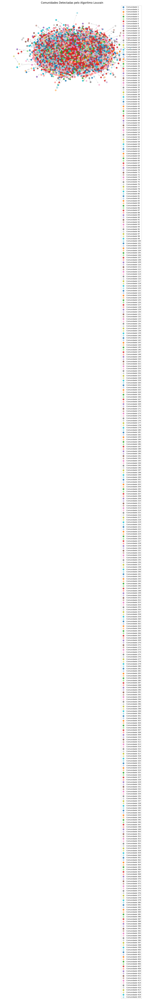

In [ ]:
# Visualização das comunidades
def visualize_communities(graph, communities):
    pos = nx.spring_layout(graph, seed=42)
    colors = plt.cm.tab20.colors

    plt.figure(figsize=(12, 8))

    for i, community in enumerate(communities):
        nx.draw_networkx_nodes(graph, pos, nodelist=list(community),
                              node_color=[colors[i % len(colors)]],
                              node_size=50, alpha=0.8, label=f'Comunidade {i+1}')

    nx.draw_networkx_edges(graph, pos, alpha=0.1)
    plt.title('Comunidades Detectadas pelo Algoritmo Louvain')
    plt.axis('off')

    # Legenda simplificada (para não ficar muito poluído)
    plt.legend(loc='upper right', fontsize=8)
    plt.show()

# Visualizar
visualize_communities(G, communities)

Comunidades visualizadas: 63
Comunidades ignoradas (tamanho 1): 333
Total de nós em comunidades únicas: 333


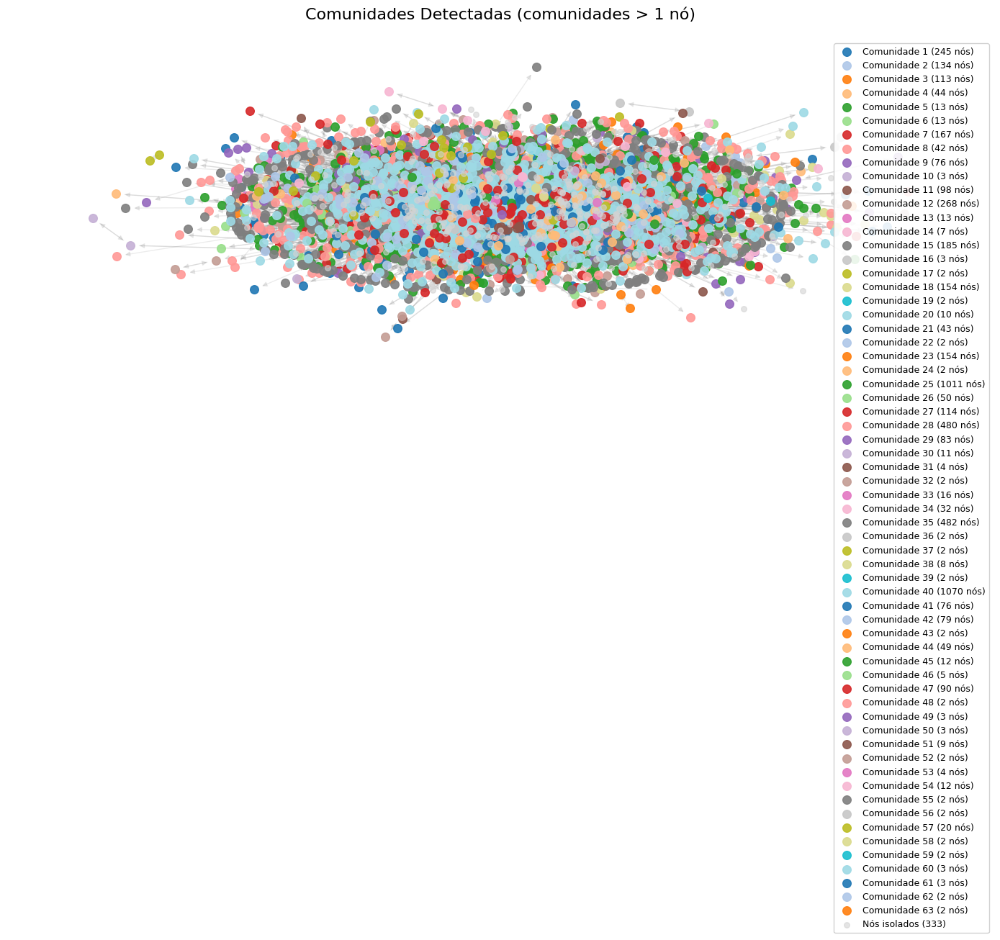

In [ ]:
# Visualização das comunidades (filtrando comunidades de tamanho 1)
def visualize_communities(graph, communities):
    # Filtrar comunidades com mais de 1 nó
    filtered_communities = [com for com in communities if len(com) > 1]
    single_nodes = [com for com in communities if len(com) == 1]

    print(f"Comunidades visualizadas: {len(filtered_communities)}")
    print(f"Comunidades ignoradas (tamanho 1): {len(single_nodes)}")
    print(f"Total de nós em comunidades únicas: {len(single_nodes)}")

    pos = nx.spring_layout(graph, seed=42)
    colors = plt.cm.tab20.colors

    plt.figure(figsize=(14, 10))

    # Desenhar comunidades com mais de 1 nó
    for i, community in enumerate(filtered_communities):
        nx.draw_networkx_nodes(graph, pos, nodelist=list(community),
                              node_color=[colors[i % len(colors)]],
                              node_size=70, alpha=0.9,
                              label=f'Comunidade {i+1} ({len(community)} nós)')

    # Desenhar nós isolados (comunidades de tamanho 1) em cinza
    all_single_nodes = [node for com in single_nodes for node in com]
    if all_single_nodes:
        nx.draw_networkx_nodes(graph, pos, nodelist=all_single_nodes,
                              node_color='lightgray',
                              node_size=30, alpha=0.6,
                              label=f'Nós isolados ({len(all_single_nodes)})')

    # Desenhar arestas
    nx.draw_networkx_edges(graph, pos, alpha=0.15, edge_color='gray')

    plt.title('Comunidades Detectadas (comunidades > 1 nó)', fontsize=16, pad=20)
    plt.axis('off')

    # Legenda
    plt.legend(loc='upper right', fontsize=9, framealpha=0.9)
    plt.tight_layout()
    plt.show()

    return filtered_communities

# Visualizar filtrando comunidades de tamanho 1
filtered_communities = visualize_communities(G, communities)

# (3) Modelos de Redes

1.   Modelo de Grafos Aleatórios
2.   Modelo Small-World
3.   Modelo Preferential Attachment



In [ ]:
# O digrafo não é fortemente conectado. Existem nós no grafo que não alcançam todos os outros nós seguindo as arestas direcionadas.
# Solução - Calcular o diâmetro do maior componente fortemente conectado
sccs = list(nx.strongly_connected_components(G))
largest_scc = max(sccs, key=len)
subgraph_scc = G.subgraph(largest_scc)

diameter_scc = nx.diameter(subgraph_scc)
print(f"Diâmetro da maior componente fortemente conectada: {diameter_scc}")

Diâmetro da maior componente fortemente conectada: 11


In [ ]:
# Coeficiente de clusterização utilizando average_clustering
average_clustering = nx.average_clustering(G)
print(f"Clusterização: {average_clustering}")

Clusterização: 0.1510698055090718


In [ ]:
# Probabilidade de existir uma aresta entre nós
p_edge = G.number_of_edges() / (G.number_of_nodes() * (G.number_of_nodes() - 1))
print(f"Probabilidade: {p_edge}")

number_n = G.number_of_nodes()
print(f"Quantidade de nós: {number_n}")

number_e = G.number_of_edges()
print(f"Quantidade de arestas: {number_e}")

Probabilidade: 0.0010292571373048454
Quantidade de nós: 5881
Quantidade de arestas: 35592


## (3.1) Grafo Aleatório

In [ ]:
random_G = nx.gnp_random_graph(number_n, p=p_edge, seed=42, directed=True)
print(f"Número de nós do grafo aleatório: {random_G.number_of_nodes()}")
print(f"Número de arestas do grafo aleatório: {random_G.number_of_edges()}")

In [ ]:
# Diâmetro
sccs = list(nx.strongly_connected_components(random_G))
largest_scc = max(sccs, key=len)
subgraph_scc = random_G.subgraph(largest_scc)

diameter_scc = nx.diameter(subgraph_scc)
print(f"Diâmetro da maior componente fortemente conectada: {diameter_scc}")

# Clusterização
average_clustering = nx.average_clustering(random_G)
print(f"Clusterização: {average_clustering}")

Diâmetro da maior componente fortemente conectada: 10
Clusterização: 0.001031339899506237


## (3.2) Small-World

In [ ]:
print(number_e / number_n)

In [ ]:
# Gerar o grafo Small-World direcionado
# k_param = max(2, int(2 * number_e / number_n))
# p_param = p_edge
k_param = 5
p_param = 0.35
print(f"k: {k_param}")
print(f"p: {p_param}")
small_world_G_undirected = nx.watts_strogatz_graph(number_n, k=k_param, p=p_param, seed=42)
small_world_G = small_world_G_undirected.to_directed()
print(f"Número de nós do grafo small-world: {small_world_G.number_of_nodes()}")
print(f"Número de arestas do grafo small-world: {small_world_G.number_of_edges()}")

k: 5
p: 0.35
Número de nós do grafo small-world: 5881
Número de arestas do grafo small-world: 23524


In [ ]:
# Diâmetro
sccs = list(nx.strongly_connected_components(small_world_G))
largest_scc = max(sccs, key=len)
subgraph_scc = small_world_G.subgraph(largest_scc)

diameter_scc = nx.diameter(subgraph_scc)
print(f"Diâmetro da maior componente fortemente conectada: {diameter_scc}")

# Clusterização
average_clustering = nx.average_clustering(small_world_G)
print(f"Clusterização: {average_clustering}")

Diâmetro da maior componente fortemente conectada: 14
Clusterização: 0.1565069648558851


## (3.3) Preferential Attachment

In [ ]:
# Gerar o grafo Preferential Attachment
preferential_attachment_G_undirected = nx.barabasi_albert_graph(number_n, (number_e // number_n), seed=42)
preferential_attachment_G = preferential_attachment_G_undirected.to_directed()
print(f"Número de nós do grafo preferential attachment: {preferential_attachment_G.number_of_nodes()}")
print(f"Número de arestas do grafo preferential attachment: {preferential_attachment_G.number_of_edges()}")

Número de nós do grafo preferential attachment: 5881
Número de arestas do grafo preferential attachment: 70500


In [ ]:
# Diâmetro
sccs = list(nx.strongly_connected_components(preferential_attachment_G))
largest_scc = max(sccs, key=len)
subgraph_scc = preferential_attachment_G.subgraph(largest_scc)

diameter_scc = nx.diameter(subgraph_scc)
print(f"Diâmetro da maior componente fortemente conectada: {diameter_scc}")

# Clusterização
average_clustering = nx.average_clustering(preferential_attachment_G)
print(f"Clusterização: {average_clustering}")

Diâmetro da maior componente fortemente conectada: 5
Clusterização: 0.01316852637922639


## (3.4) Preferential Attachment - Direcionado

In [ ]:
directed_PA = nx.random_k_out_graph(number_n, (number_e // number_n), 1.0, seed=42)
print(f"Número de nós do grafo preferential attachment: {directed_PA.number_of_nodes()}")
print(f"Número de arestas do grafo preferential attachment: {directed_PA.number_of_edges()}")

Número de nós do grafo preferential attachment: 5881
Número de arestas do grafo preferential attachment: 35286


In [ ]:
# Diâmetro
sccs = list(nx.strongly_connected_components(directed_PA))
largest_scc = max(sccs, key=len)
subgraph_scc = directed_PA.subgraph(largest_scc)

diameter_scc = nx.diameter(subgraph_scc)
print(f"Diâmetro da maior componente fortemente conectada: {diameter_scc}")

In [ ]:
# Clusterização
clustering = nx.average_clustering(nx.Graph(directed_PA.to_undirected()))
print(f"Clusterização: {clustering}")

Clusterização: 0.0031585067563175548


# (4) Falhas e Ataques

In [ ]:
# Gerar o grafo Small-World direcionado
node_n = G.number_of_nodes()
edge_n = G.number_of_edges()
print(f"Quantidade de nós: {node_n}")
print(f"Quantidade de arestas: {edge_n}")

k_param = 4
p_param = 0.35
small_world_G_undirected = nx.watts_strogatz_graph(node_n, k=k_param, p=p_param, seed=42)
SM_G = small_world_G_undirected.to_directed()
print(f"Número de nós do grafo small-world: {SM_G.number_of_nodes()}")
print(f"Número de arestas do grafo small-world: {SM_G.number_of_edges()}")

Quantidade de nós: 5881
Quantidade de arestas: 35592
Número de nós do grafo small-world: 5881
Número de arestas do grafo small-world: 23524


Rodando simulações para BitcoinOTC_G (n=5881, m=35592)
Rodando simulações para SmallWorld_SM_G (n=5881, m=23524)


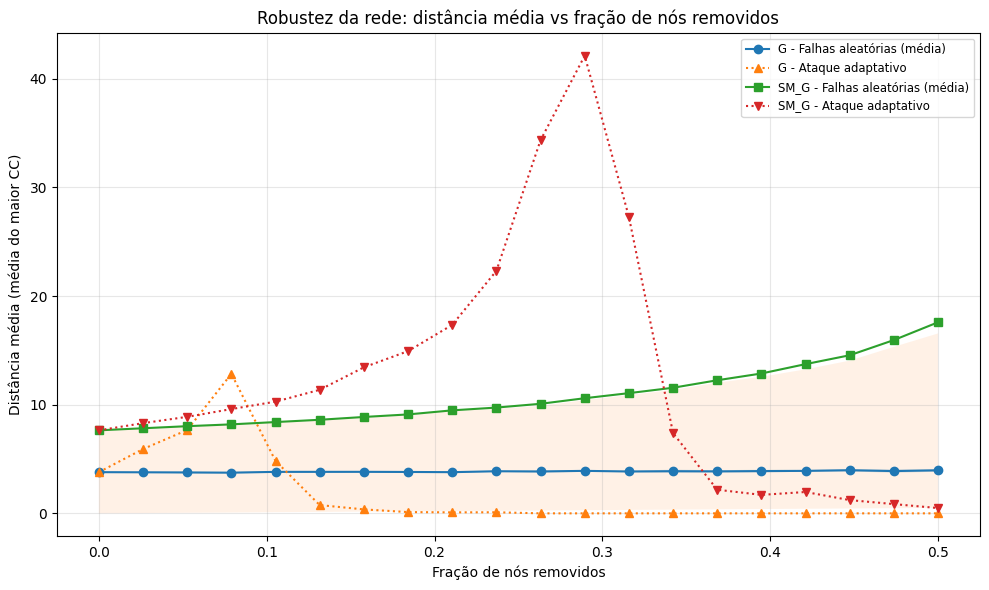

In [ ]:
random.seed(42)
np.random.seed(42)

fractions = np.linspace(0.0, 0.5, 20)   # frações de nós removidos (0%..50%)
n_iters_random = 10                     # repetições para falhas aleatórias

# função para calcular a distância média do grafo
def avg_shortest_path_largest_cc(graph):
  G_und = graph.to_undirected()

  # tirar componentes isoladas
  if G_und.number_of_nodes() == 0:
    return np.nan
  components = list(nx.connected_components(G_und))

  if len(components) == 0:
    return np.nan
  largest_cc = max(components, key=len)

  if len(largest_cc) <= 1:
    return 0.0
  subg = G_und.subgraph(largest_cc)

  try:
    asp = nx.average_shortest_path_length(subg)
    return asp
  except Exception as e:
    return np.nan

# Aproximação da distância por amostragem
def approx_avg_shortest_path(G, k=100, seed=42):
  if G.number_of_nodes() <= 1:
    return 0.0
  rng = np.random.default_rng(seed)
  nodes = list(G.nodes())
  sampled = rng.choice(nodes, size=min(k, len(nodes)), replace=False)
  dists = []
  for u in sampled:
    lengths = nx.single_source_shortest_path_length(G, u)
    dists.extend(lengths.values())
  return np.mean(dists)

# Remoção aleatória (falhas)
def simulate_random_failures(G_original, fractions, n_iters=10):
  n = G_original.number_of_nodes()
  results = np.zeros((n_iters, len(fractions)))
  nodes_list = list(G_original.nodes())

  for it in range(n_iters):
    it_range = range(len(fractions))
    for j, f in enumerate(it_range):
      frac = fractions[j]
      k_remove = int(np.floor(frac * n))
      # sorteia k_remove nós sem reposição
      removed = set(random.sample(nodes_list, k_remove)) if k_remove > 0 else set()
      subG = G_original.copy()
      subG.remove_nodes_from(removed)
      results[it, j] = approx_avg_shortest_path(subG)
  return results

# Ataque dirigido por grau: abordagem adaptativa(recalcula grau a cada passo)
def simulate_targeted_attack_adaptive(G_original, fractions):
  n = G_original.number_of_nodes()
  G_work = G_original.copy().to_undirected()  # trabalhar com não dirigido para grau
  nodes_remaining = set(G_work.nodes())

  # precomputar ordem adaptativa até 50% dos nós (pior caso)
  max_remove = int(np.floor(max(fractions) * n))
  removal_order = []
  for _ in range(max_remove):
    if len(nodes_remaining) == 0:
      break

    # escolhe nó com maior grau atual
    deg = dict(G_work.degree(nodes_remaining))
    node_max = max(deg.items(), key=lambda x: x[1])[0]
    removal_order.append(node_max)

    # remove do grafo de trabalho
    G_work.remove_node(node_max)
    nodes_remaining.remove(node_max)

  # agora para cada fração aplica os k primeiros da removal_order
  results = np.zeros(len(fractions))
  for j, frac in enumerate(fractions):
    k_remove = int(np.floor(frac * n))
    removed = set(removal_order[:k_remove])
    subG = G_original.copy()
    subG.remove_nodes_from(removed)
    results[j] = approx_avg_shortest_path(subG)
  return results

# Rodar simulações para o grafo real G e para o modelo SM_G
def run_experiments_on_graph(G_input, graph_name="G"):
  print(f"Rodando simulações para {graph_name} (n={G_input.number_of_nodes()}, m={G_input.number_of_edges()})")
  # falhas aleatórias (múltiplas iterações)
  rand_res = simulate_random_failures(G_input, fractions, n_iters=n_iters_random)
  rand_mean = np.nanmean(rand_res, axis=0)
  rand_std  = np.nanstd(rand_res, axis=0)
  # ataque adaptativo
  attack_adaptive = simulate_targeted_attack_adaptive(G_input, fractions)
  return {
    "fractions": fractions,
    "rand_mean": rand_mean,
    "rand_std": rand_std,
    "attack_adaptive": attack_adaptive
  }

# Exemplo: rodar para G e SM_G
res_G = run_experiments_on_graph(G, "BitcoinOTC_G")
res_SM = run_experiments_on_graph(SM_G, "SmallWorld_SM_G")

# --- Plotar resultados ---
plt.figure(figsize=(10,6))

# G real
plt.plot(res_G["fractions"], res_G["rand_mean"], label="G - Falhas aleatórias (média)", linestyle='-', marker='o')
plt.fill_between(res_G["fractions"], res_G["rand_mean"] - res_G["rand_std"], res_G["rand_mean"] + res_G["rand_std"], alpha=0.2)

plt.plot(res_G["fractions"], res_G["attack_adaptive"], label="G - Ataque adaptativo", linestyle=':', marker='^')

# SM model
plt.plot(res_SM["fractions"], res_SM["rand_mean"], label="SM_G - Falhas aleatórias (média)", linestyle='-', marker='s')
plt.fill_between(res_SM["fractions"], res_SM["rand_mean"] - res_SM["rand_std"], res_SM["fractions"], alpha=0.1)  # opção visual

plt.plot(res_SM["fractions"], res_SM["attack_adaptive"], label="SM_G - Ataque adaptativo", linestyle=':', marker='v')

plt.xlabel("Fração de nós removidos")
plt.ylabel("Distância média (média do maior CC)")
plt.title("Robustez da rede: distância média vs fração de nós removidos")
plt.legend(loc='best', fontsize='small')
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

# (5) Grafo Dinâmico e Centralidade de Tempo

## (5.1) Recarregando dados e visualização inicial

In [ ]:
# Recarregando o dataset
df = pd.read_csv('soc-sign-bitcoinotc.csv', header=None, names=['source', 'target', 'rating', 'time'])

df['time'] = pd.to_datetime(df['time'], unit='s')  # converte para UNIX time

print(f"Período: {df['time'].min()} → {df['time'].max()}")
df.head()

Período: 2010-11-08 18:45:11.728359938 → 2016-01-25 01:12:03.757280111


,source,target,rating,time
0,6,2,4,2010-11-08 18:45:11.728359938
1,6,5,2,2010-11-08 18:45:41.533780098
2,1,15,1,2010-11-08 19:05:40.390490055
3,4,3,7,2010-11-08 19:41:17.369750023
4,13,16,8,2010-11-08 22:10:54.447459936


## (5.2) Definição de granularidade de tempo

Com base no artigo de [Costa et al., 2015], onde é discretizado em intervalos de 30 segudos, podemos ter granularidades maiores (diária, semanal ou mensal), pois o dataset Bitcoin OTC vai de 2010 até 2016.

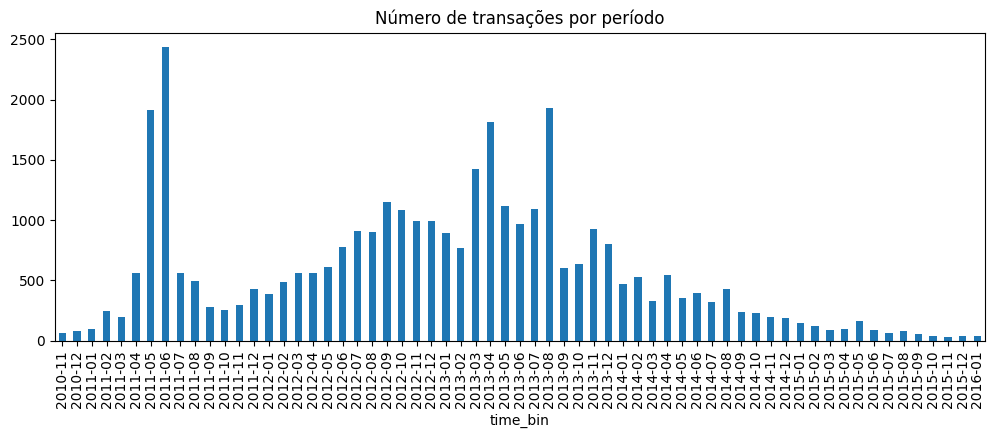

In [ ]:
# Granularidade de 30 dias
df['time_bin'] = df['time'].dt.to_period('M')  # M = mês, W = semana, D = dia

granularity_counts = df['time_bin'].value_counts().sort_index()
granularity_counts.plot(kind='bar', figsize=(12,4), title='Número de transações por período')
plt.show()

## (5.3) Criando **snapshots** (TVG)

Cada snapshot representa um grafo estático em um intervalo de tempo específico.

Um Time-Varying Graph (TVG) — ou grafo dinâmico no tempo — é um modelo que representa redes em evolução temporal. Ao invés de um grafo estático `G(V, E)`, o que temos é:
$$
H = (V, E, T)
$$
onde,
- V = conjunto de nós (usuários);
- E = conjunto de arestas (avaliações);
- T = conjunto de instantes ou intervalos (quando acontecem as avaliações).

Cada aresta é representada por um quadruplo temporal:
$$
e = (u, t_a, v, t_b)
$$
significa que o nó `u` interagiu com `v` no tempo $t_a$ (ou $t_b).

Representação de TVGs por (a) Sequência de snapshots (subgrafos estáticos): Cada snapshot representa um grafo em um intervalo de tempo fixo
$$
TVG = \{G_{t_1}, G_{t_2}, ..., G_{t_n}\}
$$

In [ ]:
snapshots = {}
for period, group in df.groupby('time_bin'):
  Gt = nx.DiGraph()
  for _, row in group.iterrows():
    Gt.add_edge(row['source'], row['target'], weight=row['rating'])
  snapshots[period] = Gt

print(f"Número de snapshots: {len(snapshots)}")

Número de snapshots: 63


## (5.4) Cálculo de métricas por snapshot

Métricas básicas: número de nós, arestas, grau médio, densidade, etc.

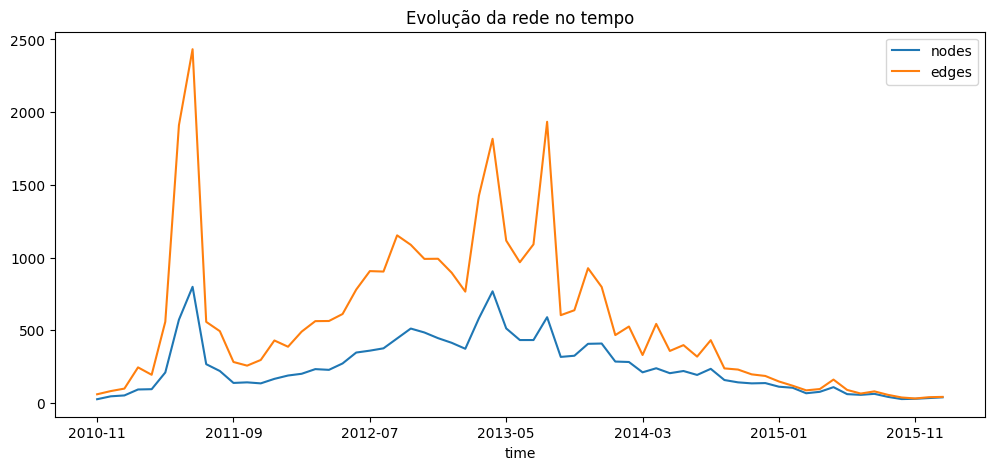

In [ ]:
metrics = []

for t, Gt in snapshots.items():
  n = Gt.number_of_nodes()
  m = Gt.number_of_edges()
  dens = nx.density(Gt)
  avg_deg = np.mean([d for _, d in Gt.degree()])
  metrics.append({'time': str(t), 'nodes': n, 'edges': m, 'density': dens, 'avg_degree': avg_deg})

metrics_df = pd.DataFrame(metrics)
metrics_df.plot(x='time', y=['nodes', 'edges'], figsize=(12,5), title='Evolução da rede no tempo')
plt.show()

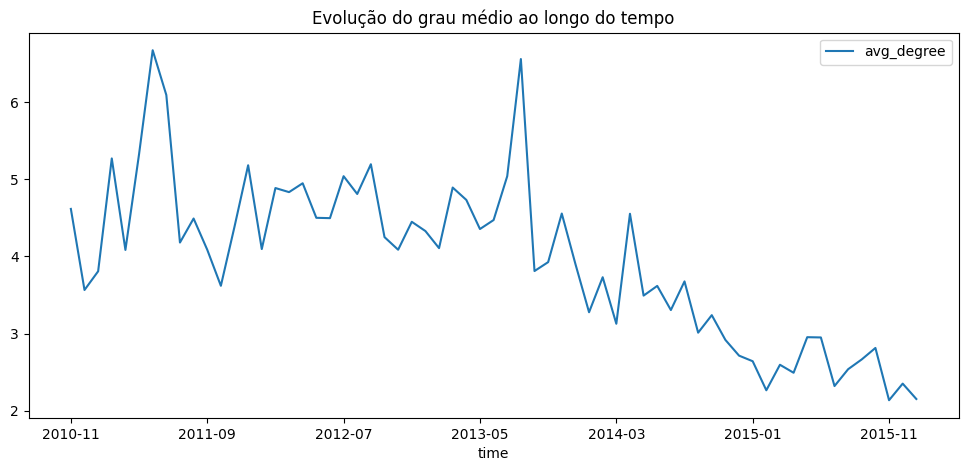

In [ ]:
metrics_df.plot(x='time', y=['avg_degree'], figsize=(12,5), title='Evolução do grau médio ao longo do tempo')
plt.show()

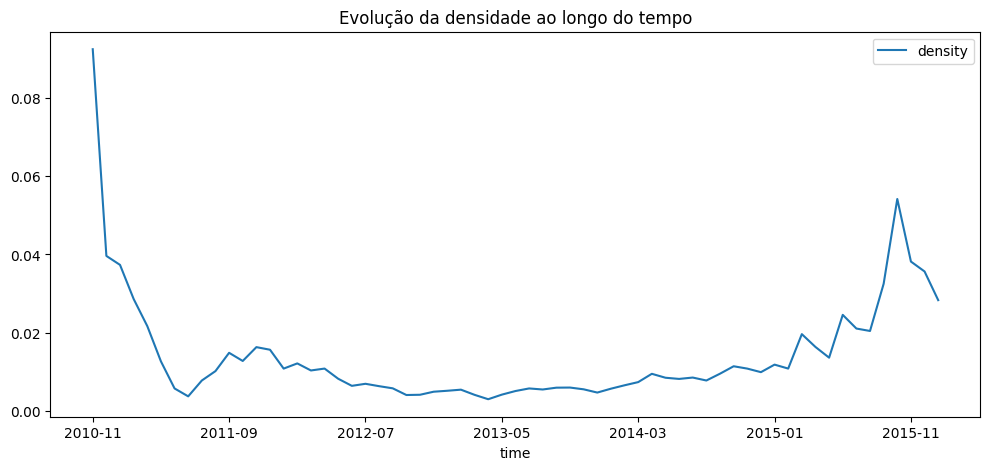

In [ ]:
metrics_df.plot(x='time', y=['density'], figsize=(12,5), title='Evolução da densidade ao longo do tempo')
plt.show()

## (5.5) Time Centrality (difusão) — Cover Time e Time-Constrained Coverage

É a importância de um instante no tempo de um grafo dinâmico. Em vez de medir qual nó é mais central (grau, betweeness, etc.), mede-se quando é mais eficiente iniciar um processo dinâmico.

Conforme [Costa et al., 2015], é possível simular uma difusão BFS e medir:

1. Cover Time (CT) → tempo médio (em número de passos) que uma difusão iniciada num instante $t_i$ leva para atingir uma fração $τ$ dos nós do grafo:
$$
CT(t_i, τ) = \frac{1}{|V|} ∑_{u \in V} d_t(t_i, u, τ)
$$
onde $d_t(t_i, u, τ)$ é o número de instantes necessários para que a difusão, iniciada no nó $u$ no tempo $t_i$ alcance uma fração τ dos nós.
- Se a fração τ não for atingida, $CT(t_i, τ) = ∞$.
- O menor CT indica instantes mais centrais no tempo, pois a difusão é mais rápida.

2. Time-Constrained Coverage (TCC) → Frações médias de nós alcançadas após um número fixo de passos Φ:
$$
TCC(t_i, Φ) = \frac{1}{|V|^2} ∑_{u \in V} d_c(t_i, u, Φ)
$$
onde $d_c(t_i, u, Φ)$ é o número de nós alcançados após Φ passos, iniciando do nó $u$ no tempo $t_i$.
- O maior TCC indica instantes mais centrais, porque a difusão cobre mais nós em menos tempo.
- O TCC é complementar ao CT: enquanto CT mede “quanto tempo demora”, TCC mede “quanto foi alcançado”.

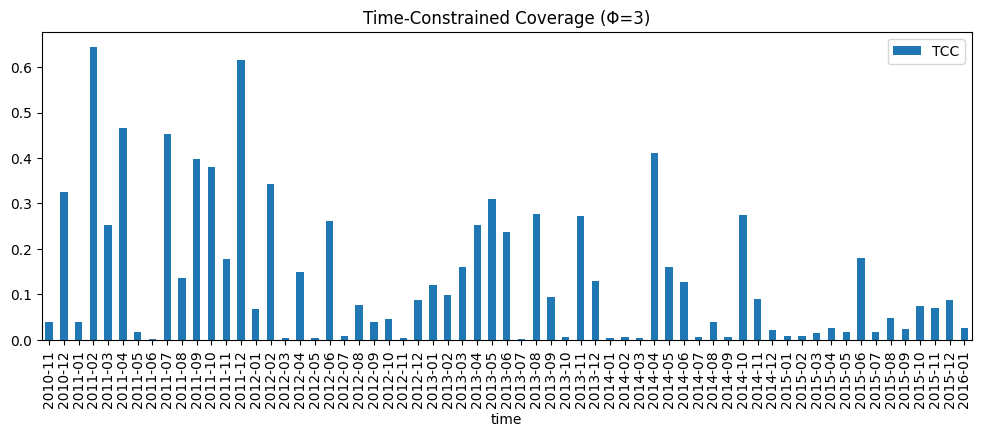

In [ ]:
def diffusion_coverage(G, start_node, steps):
  reached = {start_node}
  frontier = {start_node}
  for _ in range(steps):
    new_frontier = set()
    for node in frontier:
      new_frontier.update(G.successors(node))
    reached.update(new_frontier)
    frontier = new_frontier
  return len(reached) / G.number_of_nodes()

# Exemplo de cálculo por snapshot
Φ = 3  # número de passos
TCC = []

for t, Gt in snapshots.items():
  if Gt.number_of_nodes() > 0:
    start_node = random.choice(list(Gt.nodes()))
    coverage = diffusion_coverage(Gt, start_node, Φ)
    TCC.append({'time': str(t), 'TCC': coverage})

pd.DataFrame(TCC).plot(x='time', y='TCC', kind='bar', figsize=(12,4))
plt.title('Time-Constrained Coverage (Φ=3)')
plt.show()

## (5.6) Connectivity-based Time Centrality [Souza et al., 2021]

Cada snapshot é tratado como um nó no grafo do tempo, e conexões entre snapshots refletem continuidade (ex.: arestas de um mesmo usuário entre períodos).

Connectivity-based Centrality → (TDC/TPR) Identificar períodos de maior conectividade entre usuários

In [ ]:
time_graph = nx.DiGraph()

# Cria grafo entre snapshots — conectando tempos consecutivos com base em nós compartilhados
periods = list(snapshots.keys())
for i in range(len(periods) - 1):
  G1, G2 = snapshots[periods[i]], snapshots[periods[i+1]]
  common_nodes = set(G1.nodes()) & set(G2.nodes())
  if len(common_nodes) > 0:
    time_graph.add_edge(periods[i], periods[i+1], weight=len(common_nodes))

# Centralidades de tempo
deg_cent = nx.degree_centrality(time_graph)
pagerank_cent = nx.pagerank(time_graph)

print("Top períodos por Time Degree Centrality:")
print(sorted(deg_cent.items(), key=lambda x: x[1], reverse=True)[:5])

Top períodos por Time Degree Centrality:
[(Period('2010-12', 'M'), 0.03225806451612903), (Period('2011-01', 'M'), 0.03225806451612903), (Period('2011-02', 'M'), 0.03225806451612903), (Period('2011-03', 'M'), 0.03225806451612903), (Period('2011-04', 'M'), 0.03225806451612903)]


## (5.7) Comparação entre snapshots centrais e não centrais

Comparar a difusão iniciada em snapshots “centrais” (com maior TCC ou menor CT) versus snapshots aleatórios.

1. Ordenar os snapshots pelos maiores valores de TCC.
2. Escolher o top 5% dos períodos mais centrais e outros aleatórios.
3. Comparar a média da cobertura obtida por cada grupo.

Permite identificar em quais meses a rede foi mais eficiente para propagação de confiança.

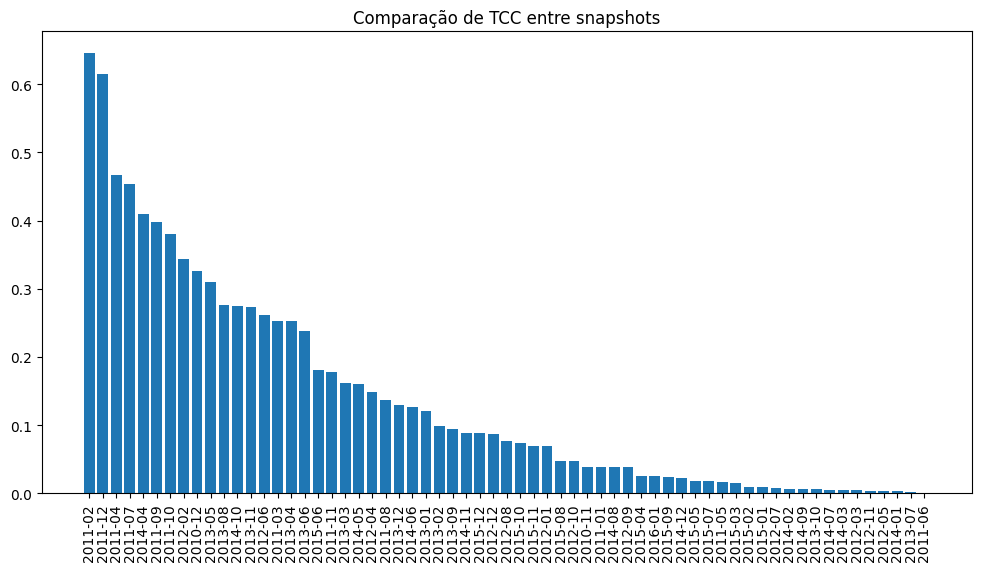

In [ ]:
tcc_df = pd.DataFrame(TCC).sort_values(by='TCC', ascending=False)
top_periods = tcc_df.head(5)['time']
random_periods = tcc_df.sample(5)['time']

plt.figure(figsize=(12, 6))
plt.bar(tcc_df['time'], tcc_df['TCC'])
plt.xticks(rotation=90)
plt.title('Comparação de TCC entre snapshots')
plt.show()

## (5.8) Time PageRank Centrality

Busca entender quais períodos são estruturalmente mais importantes na evolução da rede.

1. Plotar a evolução dos valores de `pagerank_cent` no tempo.
2. Comparar com o número de transações (atividade).
3. Ver se períodos com alto PageRank coincidem com picos de atividade ou confiança.

Períodos com alto Time PageRank são pontos de estabilidade da rede, que mantêm conexões significativas com períodos anteriores e futuros.
Eles podem representar épocas de continuidade (menos fragmentação e maior confiança entre usuários).

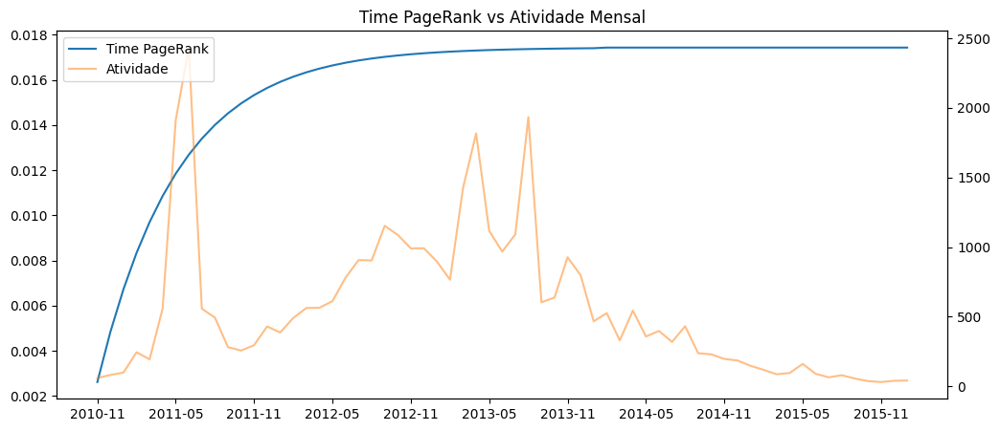

In [ ]:
pagerank_df = pd.DataFrame({
  'time': [str(k) for k in pagerank_cent.keys()],
  'pagerank': [v for v in pagerank_cent.values()]
}).sort_values('time')

activity_df = granularity_counts.reset_index()
activity_df.columns = ['time', 'transactions']
# Convert the 'time' column in activity_df to string to match pagerank_df
activity_df['time'] = activity_df['time'].astype(str)

merged = pagerank_df.merge(activity_df, on='time', how='left')
merged = merged.sort_values(by='time', key=lambda x: pd.to_datetime(x))

fig, ax1 = plt.subplots(figsize=(12,5))
ax1.plot(merged['time'], merged['pagerank'], label='Time PageRank', color='tab:blue')
ax2 = ax1.twinx()
ax2.plot(merged['time'], merged['transactions'], label='Atividade', color='tab:orange', alpha=0.5)
ax1.set_title('Time PageRank vs Atividade Mensal')

# Combine legends from both axes
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax2.legend(lines1 + lines2, labels1 + labels2, loc='upper left')

# Rotate x-axis labels
plt.xticks(merged['time'][::6], rotation=45)  # mostra 1 a cada 6 meses

plt.show()

### Interpretação Geral (ChatGPT):

#### 🟠 Curva laranja — Atividade mensal

A curva mostra picos em 2011-05, 2012-11 e novamente em 2013, seguidos de uma queda gradual até 2015.

Isso indica que a rede teve momentos de intensa interação (muitos usuários avaliando outros), possivelmente por crescimento inicial do mercado ou eventos externos ligados ao Bitcoin.

💡 Conclusão:
A rede é esporádica, com picos de transação concentrados em certos períodos, em vez de manter uma atividade estável.

### 🔵 Curva azul — Time PageRank

Ela cresce rapidamente entre 2010 e 2012, depois atinge um platô quase constante.

Isso mostra que, com o passar do tempo, os snapshots mais recentes continuam conectados com os anteriores (muitos nós persistem ao longo dos meses).

Após 2012, mesmo com menos transações, a estrutura temporal da rede se estabiliza, mantendo uma continuidade entre períodos.

💡 Conclusão:
Enquanto a atividade diminui, a importância temporal da rede permanece alta, sugerindo que as conexões entre períodos permanecem fortes — ou seja, usuários antigos continuam ativos e mantendo o tecido estrutural da rede.

#### Interpretação segundo Souza et al. (2021)

De acordo com o conceito de **Connectivity-based Time Centrality**, períodos com alto Time PageRank são temporalmente centrais, pois:

- Estão conectados a muitos outros períodos (alta persistência dos nós).
- Servem como pontes entre diferentes épocas da rede.

Assim:

- 2010–2012: crescimento do Time PageRank → aumento da conectividade temporal.
- Após 2012: estabilização → a rede entra em regime “maduro”, com estrutura consolidada.

Mesmo que a atividade diminua, os laços temporais permanecem fortes, mantendo a rede coesa.

#### 💬 Conclusão prática:
O Time PageRank captura a continuidade estrutural da rede (como ela “mantém-se conectada no tempo”), enquanto a atividade mostra apenas o volume instantâneo de interações.
Essa diferença é o que os artigos ressaltam: Time Centrality revela momentos de relevância estrutural, não apenas picos de eventos.

In [ ]:
merged[['pagerank', 'transactions']].corr()

,pagerank,transactions
pagerank,1.000000,0.088395
transactions,0.088395,1.000000


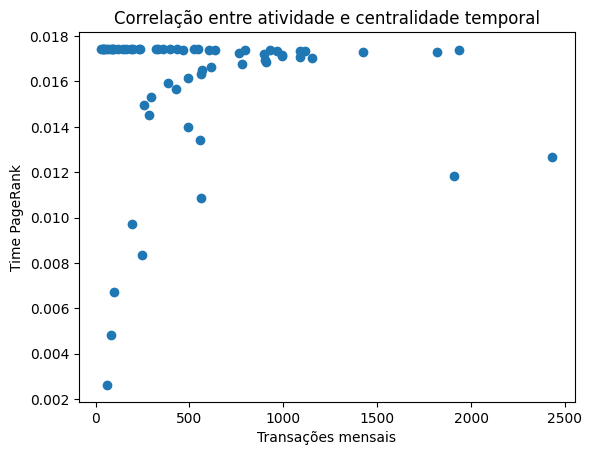

In [ ]:
# Calcular a correlação entre atividade e PageRank: mostra se existe ou não dependência direta entre atividade e centralidade temporal.
# Se a correlação for baixa, isso reforça que a estrutura temporal é estável independentemente do volume de transações

merged[['pagerank', 'transactions']].corr()

plt.scatter(merged['transactions'], merged['pagerank'])
plt.xlabel('Transações mensais')
plt.ylabel('Time PageRank')
plt.title('Correlação entre atividade e centralidade temporal')
plt.show()

## (5.9) Análise de polaridade média por snapshot

Extensão natural do dataset (dados possuem “rating”, ou seja, uma avaliação de confiança).

O objetivo é associar aspectos de confiança (rating) com as métricas de centralidade temporal.

1. Calcular a média e desvio padrão das avaliações (`rating`) por snapshot.
2. Ver se períodos com TCC ou PageRank altos têm, em média, avaliações positivas (maior confiança).

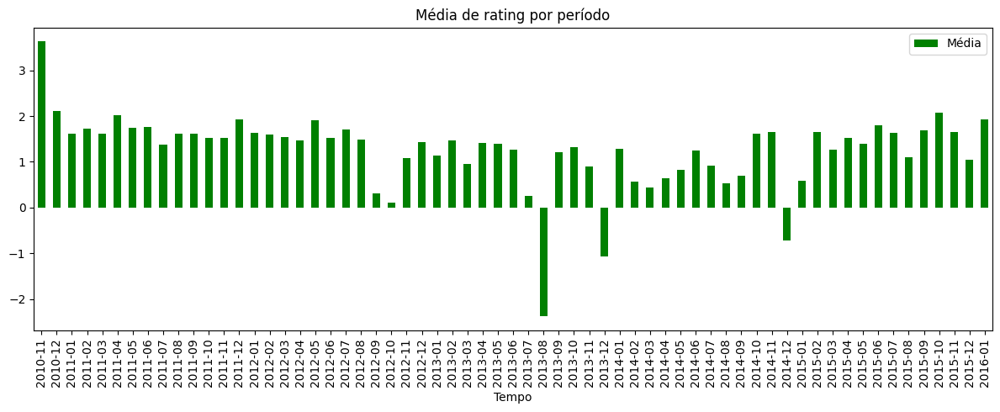

In [ ]:
ratings_by_time = df.groupby('time_bin')['rating'].agg(['mean', 'std']).reset_index()
# Convert 'time_bin' column to string for merging
ratings_by_time['time_bin'] = ratings_by_time['time_bin'].astype(str)
merged_metrics = metrics_df.merge(ratings_by_time, left_on='time', right_on='time_bin', how='left')

merged_metrics.plot(x='time', y='mean', kind='bar', figsize=(12,5), color='green', title='Média de rating por período', label='Média') # Added label
plt.xlabel('Tempo') # Added x-axis label
plt.xticks(rotation=90) # Rotate x-axis labels for readability
plt.tight_layout() # Adjust layout to prevent overlapping
plt.legend() # Added legend display
plt.show()

## (5.10) Correlação entre métricas de tempo e estrutura

Costa et al. (2015), análise de relação entre difusão e características do grafo.

O objetivo é verificar se períodos com maior densidade ou grau médio também são mais centrais no tempo.

Pode revelar se a estrutura influencia a centralidade temporal ou se há fenômenos independentes (por exemplo, períodos com poucos nós, mas centrais em difusão).

In [ ]:
merged_corr = metrics_df.merge(pd.DataFrame(TCC), on='time', how='left')
merged_corr['pagerank'] = merged_corr['time'].map(lambda t: pagerank_cent.get(pd.Period(t), np.nan))
corr = merged_corr[['density', 'avg_degree', 'TCC', 'pagerank']].corr()
print(corr)

             density  avg_degree       TCC  pagerank
density     1.000000   -0.286703 -0.006021 -0.587430
avg_degree -0.286703    1.000000  0.354970 -0.297319
TCC        -0.006021    0.354970  1.000000 -0.299834
pagerank   -0.587430   -0.297319 -0.299834  1.000000
